# Task 3 — 30-Day Revenue Prediction

Predict `revenue_30d` per user from D1-D3 behavior. The target is
**massively zero-inflated** (~98.3% of users book $0), so the model of
choice is a **two-stage** one:

1. **Stage 1** — classification: `P(payer_30d = 1)`
2. **Stage 2** — regression: `E[revenue | payer]` trained on payers only
3. **Final prediction**: `P(payer) x E[revenue | payer]`

We also train a single-stage regressor on all users as a sanity check.

## Step 0 — Setup & Data Loading

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import copy
import numpy as np
import lightgbm as lgb
import pandas as pd
from pathlib import Path
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
pio.templates.default = 'plotly_white'

from sklearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_recall_curve, roc_curve, confusion_matrix, median_absolute_error, roc_auc_score, average_precision_score, mean_absolute_error, mean_squared_error, r2_score



SEED = 42
np.random.seed(SEED)

pd.set_option('display.max_columns', 120)
pd.set_option('display.float_format', lambda x: f'{x:,.4f}')

DATA_DIR = Path('/Users/invoke/Desktop/DS_v2/task_dataset')
train_raw = pd.read_csv(DATA_DIR / 'train.csv')
test_raw  = pd.read_csv(DATA_DIR / 'test.csv')

print(f'train: {train_raw.shape}')
print(f'test:  {test_raw.shape}')
print(f'common cols: {len(set(train_raw.columns) & set(test_raw.columns))}')

train: (390417, 109)
test:  (224350, 109)
common cols: 109


In [2]:
# Drop pure identifier / metadata columns upfront (kept out of the feature set;
# we keep a copy of user_id on the side only for test-submission alignment).
DROP_UPFRONT = ['user_id', 'dataset_split', 'registration_date']

test_user_ids = test_raw['user_id'].copy()

train = train_raw.drop(columns=DROP_UPFRONT).copy()
test  = test_raw.drop(columns=DROP_UPFRONT).copy()

print(f'train after id drop: {train.shape}')
print(f'test  after id drop: {test.shape}')

train after id drop: (390417, 106)
test  after id drop: (224350, 106)


In [3]:
train.head(10)

,platform,country,device_price_tier,os_recency,geo_ppp_index,screen_tier,storage_gb,app_opens_3d,workspace_opens_3d,feature_opens_3d,feature_applies_3d,saves_3d,total_events_3d,workspace_open_rate,feature_apply_rate,save_rate,funnel_completion_rate,max_funnel_depth,distinct_features_used,avg_actions_per_session,median_inter_open_hrs,time_to_first_save_hrs,time_to_first_apply_min,has_reached_activation,peak_hour,events_per_open,session_count,converted_in_3d,conversion_day,promo_views_3d,promo_dismiss_rate,ads_viewed_3d,ads_per_session,events_after_ad_ratio,promo_to_convert_hrs,promos_before_convert,d1_retained,d2_retained,d3_retained,days_active_of_3,event_trend_d1_d3,save_trend_d1_d3,diversity_trend_d1_d3,engagement_score,monetization_score,activation_velocity,device_x_geo,depth_ratio,ad_fatigue_flag,user_segment,reg_day_of_week,reg_is_weekend,reg_hour,reg_day_part,weekend_event_share,weekday_event_share,weekend_weekday_ratio,peak_day_of_week,evening_share,morning_share,night_owl_flag,hour_entropy,timing_consistency,reg_to_first_action_min,reg_to_first_save_hrs,d1_events,d1_saved,d1_converted,d1_promo_viewed,d1_funnel_depth,d1_feature_diversity,d1_event_share,reg_day_is_holiday,d1_d2_gap_hrs,d1_sessions,paid_feature_taps_3d,distinct_paid_features,paid_taps_per_session,paid_tap_d1,paid_tap_d2,paid_tap_d3,days_with_paid_taps,first_paid_tap_hour,top_paid_feature,paid_to_free_ratio,paid_tap_share,free_power_user_with_paid_intent,paid_interest_no_save,free_saves_with_paid_taps,paid_feature_trend_d1_d3,paid_tap_to_promo_rate,paid_tap_then_exit_rate,events_after_paid_rejection,paid_tap_to_convert,paid_taps_before_convert,promo_after_paid_tap_dismiss_rate,specific_feature_flag_A,specific_feature_flag_B,specific_feature_flag_C,paid_hunger_score,paid_intent_score,paid_conversion_readiness,paid_frustration_risk,paid_interest_segment,is_payer_30d,revenue_30d
0,ios,us,3,1.0000,1.0000,3,NaN,1,2,7,6,2,18,2.0000,0.8571,0.3333,2.0000,5,2,18.0000,NaN,0.0461,2.3500,1,1,17.0000,1,0,NaN,1,1.0000,0,0.0000,NaN,NaN,NaN,1,0,0,1,0.0000,0.0000,0.0000,0.4023,0.0000,0.9559,3.0000,2.6667,0,segment_A,3,0,1,night,0.0000,1.0000,0.0000,3,0.0000,0.0000,1,0.0000,NaN,-93.1500,0.0461,18,1,0,1,5,2,1.0000,0,NaN,1,3,1,3.0000,3,0,0,1,0.0069,feature_10,0.7498,0.4286,1,0,1,0.0000,0.0000,0.0000,0.0000,0,0,1.0000,0,0,0,1.3863,0.4714,0,0,level_1,0,0.0000
1,ios,us,3,1.0000,1.0000,3,NaN,3,10,23,7,7,50,3.3333,0.3043,1.0000,2.3333,5,11,16.6667,NaN,0.0311,1.7833,1,5,15.6667,3,0,NaN,2,1.0000,2,0.6667,25.0000,NaN,NaN,1,0,0,1,0.0000,0.0000,0.0000,0.4850,0.0000,0.9698,3.0000,1.0769,0,segment_A,5,1,5,night,1.0000,0.0000,NaN,5,0.0000,0.0000,1,0.0000,NaN,-338.9333,0.0311,50,1,0,1,5,11,1.0000,0,NaN,3,9,3,3.0000,9,0,0,1,0.0156,feature_07,0.6428,0.3913,0,0,1,0.0000,0.0000,0.0000,0.0000,0,0,1.0000,0,0,0,2.3026,0.4565,0,0,level_1,0,0.0000
2,ios,us,1,1.0000,1.0000,3,NaN,1,0,39,5,5,50,0.0000,0.1282,1.0000,5.0000,5,6,7.1429,NaN,0.1422,8.5000,1,13,49.0000,7,0,NaN,1,1.0000,0,0.0000,NaN,NaN,NaN,1,0,0,1,0.0000,0.0000,0.0000,0.4293,0.0000,0.8755,1.0000,10.0000,0,segment_A,1,0,12,afternoon,0.0000,1.0000,0.0000,1,0.0000,0.0000,0,0.0000,NaN,NaN,0.1422,50,1,0,1,5,6,1.0000,0,NaN,7,23,4,3.2857,23,0,0,1,0.0203,feature_14,1.4374,0.5897,0,0,1,0.0000,0.0000,0.0000,0.0000,0,0,1.0000,0,0,0,3.1781,0.5359,0,0,level_1,0,0.0000
3,ios,us,1,1.0000,1.0000,2,NaN,1,1,19,4,3,28,1.0000,0.2105,0.7500,3.0000,5,9,28.0000,NaN,0.0764,1.8667,1,19,27.0000,1,0,NaN,2,0.5000,0,0.0000,NaN,NaN,NaN,1,0,0,1,0.0000,0.0000,0.0000,0.3819,0.5493,0.9290,1.0000,3.5000,0,segment_A,4,0,19,evening,0.0000,1.0000,0.0000,4,0.9643,0.0000,0,0.0000,NaN,"-1,176.1000",0.0764,28,1,0,1,5,9,1.0000,0,NaN,1,5,3,5.0000,5,0,0,1,0.0217,feature_07,0.3571,0.2632,0,0,1,0.0000,0.0000,0.0000,0.0000,0,0,0.5000,0,0,0,1.7918,0.4053,0,0,level_1,0,0.0000
4,ios,us,2,1.0000,1.0000,3,NaN,1,4,8,2,1,16,4.0000,0.2500,0.5000,1.0000,5,5,16.0000,NaN,0.0394,1.6833,1,1,15.0000,1,0,NaN,2,1.0000,0,0.0000,NaN,NaN,NaN,1,0,0,1,0.0000,0.0000,0.0000,0.3075,0.0000,0.9621,2.0000,0.6000,0

## Step 1 — EDA

Walk through the target, the most promising predictors, and the data-quality
issues we'll need to fix in Step 2.

### 1a. Target analysis

In [4]:
# Payer prevalence
payer_rate_train = train['is_payer_30d'].mean()
payer_rate_test  = test['is_payer_30d'].mean()
print(f'Payer rate — train: {payer_rate_train*100:.3f}%  test: {payer_rate_test*100:.3f}%')
print(f'Train payers: {int(train["is_payer_30d"].sum()):,} of {len(train):,}')
print(f'Test  payers: {int(test["is_payer_30d"].sum()):,} of {len(test):,}')

# Revenue distribution overall + among payers
rev = train['revenue_30d']
print(f'\nRevenue (all users):')
print(f'  zero share: {(rev == 0).mean()*100:.3f}%')
print(f'  mean: ${rev.mean():.4f}  median: ${rev.median():.4f}')

payers_rev = rev[train['is_payer_30d'] == 1]
print(f'\nRevenue (payers only, n={len(payers_rev):,}):')
print(payers_rev.describe())

Payer rate — train: 1.690%  test: 1.801%
Train payers: 6,598 of 390,417
Test  payers: 4,040 of 224,350

Revenue (all users):
  zero share: 98.310%
  mean: $1.0178  median: $0.0000

Revenue (payers only, n=6,598):
count   6,598.0000
mean       60.2273
std        26.7269
min         1.9900
25%        52.9900
50%        78.9900
75%        78.9900
max       145.9800
Name: revenue_30d, dtype: float64


In [5]:
# Revenue tier breakdown among payers
tier_counts = payers_rev.value_counts().head(10)
tier_pct = (tier_counts / len(payers_rev) * 100).round(2)
tier_tbl = pd.DataFrame({'n': tier_counts, 'pct': tier_pct})
print('Top revenue tiers among payers:')
print(tier_tbl.to_string())

Top revenue tiers among payers:
                n     pct
revenue_30d              
78.9900      3562 53.9900
13.9900       852 12.9100
72.9900       622  9.4300
52.9900       569  8.6200
11.9900       482  7.3100
39.4900       164  2.4900
61.9900       144  2.1800
8.9900         38  0.5800
36.5000        26  0.3900
55.9900        25  0.3800


In [6]:
# Target visuals: payer share + revenue histogram among payers
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=(
        f'Payer rate in train ({payer_rate_train*100:.2f}%)',
        'revenue_30d among payers',
    ),
)
# Left: payer share bar
shares = [1 - payer_rate_train, payer_rate_train]
fig.add_trace(
    go.Bar(
        x=['non-payer', 'payer'], y=shares,
        marker_color=['lightgrey', 'steelblue'],
        text=[f'{v*100:.2f}%' for v in shares],
        textposition='outside',
        showlegend=False,
    ),
    row=1, col=1,
)
fig.update_yaxes(title_text='Share of users', row=1, col=1)

# Right: revenue histogram among payers
fig.add_trace(
    go.Histogram(
        x=payers_rev, nbinsx=40,
        marker=dict(color='steelblue', line=dict(color='black', width=1)),
        showlegend=False,
    ),
    row=1, col=2,
)
fig.add_vline(
    x=float(payers_rev.median()),
    line_dash='dash', line_color='red',
    annotation_text=f'median ${payers_rev.median():.2f}',
    row=1, col=2,
)
fig.update_xaxes(title_text='Revenue ($)', row=1, col=2)
fig.update_yaxes(title_text='Payers', row=1, col=2)

fig.update_layout(height=430, showlegend=False)
fig.show()


### 1b. Top predictors — quick signal check

In [7]:
# converted_in_3d -> is_payer_30d is expected to be the dominant signal.
conv_table = pd.crosstab(train['converted_in_3d'], train['is_payer_30d'],
                         margins=True, margins_name='Total')
print('converted_in_3d x is_payer_30d (counts):')
print(conv_table)

conv_rate = (
    train.groupby('converted_in_3d')['is_payer_30d']
    .agg(['sum', 'count'])
)
conv_rate['payer_rate_pct'] = conv_rate['sum'] / conv_rate['count'] * 100
print('\nPayer rate by converted_in_3d:')
print(conv_rate.to_string())

# Late converters: didn't convert in 3d but paid within 30d
late = train[(train['converted_in_3d'] == 0) & (train['is_payer_30d'] == 1)]
print(f'\nLate converters (D4-D30 payers): {len(late):,}')

converted_in_3d x is_payer_30d (counts):
is_payer_30d          0     1   Total
converted_in_3d                      
0                354566   618  355184
1                 29253  5980   35233
Total            383819  6598  390417

Payer rate by converted_in_3d:
                  sum   count  payer_rate_pct
converted_in_3d                              
0                 618  355184          0.1740
1                5980   35233         16.9727

Late converters (D4-D30 payers): 618


In [8]:
# user_segment x payer rate
for col in ['user_segment', 'paid_interest_segment', 'platform', 'reg_day_part']:
    if col not in train.columns:
        continue
    tbl = (
        train.groupby(col)['is_payer_30d']
        .agg(['sum', 'count'])
        .sort_values('count', ascending=False)
    )
    tbl['payer_rate_pct'] = tbl['sum'] / tbl['count'] * 100
    print(f'\n-- {col} --')
    print(tbl.round(3).to_string())


-- user_segment --
               sum   count  payer_rate_pct
user_segment                              
segment_A     5000  374574          1.3350
segment_C     1289    9533         13.5210
segment_D      303    4322          7.0110
segment_B        6    1988          0.3020

-- paid_interest_segment --
                        sum   count  payer_rate_pct
paid_interest_segment                              
level_1                 314  200764          0.1560
level_0                 160  109632          0.1460
level_2                 144   44788          0.3220
level_3                5980   35233         16.9730

-- platform --
           sum   count  payer_rate_pct
platform                              
ios       5448  296626          1.8370
android   1150   93791          1.2260

-- reg_day_part --
               sum   count  payer_rate_pct
reg_day_part                              
night         2780  160442          1.7330
evening       1705   95480          1.7860
afternoon     132

In [9]:
# Top correlated numeric features with the binary target
num_cols = train.select_dtypes(include=[np.number]).columns
num_cols = [c for c in num_cols if c not in ('is_payer_30d', 'revenue_30d')]
corr_binary = (
    train[num_cols + ['is_payer_30d']]
    .corr(numeric_only=True)['is_payer_30d']
    .drop('is_payer_30d')
    .sort_values(ascending=False)
)
print('Top 15 positive correlations with is_payer_30d:')
print(corr_binary.head(15).to_string())
print('\nTop 5 negative correlations:')
print(corr_binary.tail(5).to_string())

Top 15 positive correlations with is_payer_30d:
converted_in_3d             0.3734
d1_converted                0.3629
paid_tap_to_convert         0.3576
monetization_score          0.2292
paid_conversion_readiness   0.1604
workspace_opens_3d          0.1045
distinct_features_used      0.1003
workspace_open_rate         0.0934
d1_feature_diversity        0.0890
distinct_paid_features      0.0866
saves_3d                    0.0824
save_rate                   0.0798
max_funnel_depth            0.0736
has_reached_activation      0.0732
free_saves_with_paid_taps   0.0726

Top 5 negative correlations:
paid_tap_to_promo_rate        NaN
paid_tap_then_exit_rate       NaN
events_after_paid_rejection   NaN
paid_taps_before_convert      NaN
paid_frustration_risk         NaN


### 1c. Data-quality audit

In [10]:
# Null share per column
null_share = train.isna().mean().sort_values(ascending=False) * 100
always_null = null_share[null_share == 100].index.tolist()
high_null   = null_share[(null_share < 100) & (null_share >= 40)]
print(f'Columns 100% null (drop): {always_null}')
print(f'\nColumns 40-100% null:')
print(high_null.round(2).to_string())

Columns 100% null (drop): ['timing_consistency', 'median_inter_open_hrs', 'd1_d2_gap_hrs']

Columns 40-100% null:
promos_before_convert     97.6600
promo_to_convert_hrs      90.9800
conversion_day            90.9800
events_after_ad_ratio     89.8600
storage_gb                76.1900
reg_to_first_save_hrs     56.7400
time_to_first_save_hrs    56.7400
time_to_first_apply_min   44.8200
reg_to_first_action_min   43.3700


In [11]:
# Single-value (zero variance) columns — useless for modeling.
single_val = [c for c in train.columns if train[c].nunique(dropna=True) <= 1]
print(f'Single-value columns (drop): {single_val}')
if 'country' in train.columns:
    print(f"  country unique values: {train['country'].unique().tolist()}")

Single-value columns (drop): ['country', 'geo_ppp_index', 'median_inter_open_hrs', 'd1_retained', 'hour_entropy', 'timing_consistency', 'reg_day_is_holiday', 'd1_d2_gap_hrs', 'paid_tap_to_promo_rate', 'paid_tap_then_exit_rate', 'events_after_paid_rejection', 'paid_taps_before_convert', 'paid_frustration_risk']
  country unique values: ['us']


In [12]:
# Leakage / suspicious columns audit.
# conversion_day, promo_to_convert_hrs, promos_before_convert describe the D1-D3
# conversion event. High null = "didn't convert in 3d", NOT a 30-day leak.
leak_candidates = ['conversion_day', 'promo_to_convert_hrs',
                   'promos_before_convert', 'paid_tap_to_convert',
                   'paid_taps_before_convert']
for c in leak_candidates:
    if c not in train.columns:
        continue
    n_null   = train[c].isna().sum()
    n_null_nonconv = train.loc[train['converted_in_3d'] == 0, c].isna().sum()
    n_non_conv     = (train['converted_in_3d'] == 0).sum()
    print(f'{c:30s}  total null={n_null:>7,}  '
          f'null among non-converters={n_null_nonconv:,} of {n_non_conv:,}'
          f'  ({n_null_nonconv/max(n_non_conv,1)*100:.1f}%)')
# These should be ~100% null for non-converters, confirming they're D1-D3 fields
# populated only for early converters — safe, NOT post-30d leakage.

conversion_day                  total null=355,184  null among non-converters=355,184 of 355,184  (100.0%)
promo_to_convert_hrs            total null=355,184  null among non-converters=355,184 of 355,184  (100.0%)
promos_before_convert           total null=381,266  null among non-converters=355,184 of 355,184  (100.0%)
paid_tap_to_convert             total null=      0  null among non-converters=0 of 355,184  (0.0%)
paid_taps_before_convert        total null=      0  null among non-converters=0 of 355,184  (0.0%)


In [13]:
# Negative-value sanity check on duration-like columns
dur_cols = [c for c in train.columns if any(
    k in c for k in ('hrs', 'min', 'time_to', 'reg_to'))]
neg_report = {}
for c in dur_cols:
    if train[c].dtype.kind in 'iuf':
        n_neg = (train[c] < 0).sum()
        if n_neg:
            neg_report[c] = int(n_neg)
print(f'Duration-like columns with negative values: {neg_report}')

Duration-like columns with negative values: {'reg_to_first_action_min': 215926}


In [14]:
# Final EDA summary — one compact dataframe for the write-up.
eda_summary = pd.DataFrame({
    'dtype': train.dtypes.astype(str),
    'null_pct': train.isna().mean().mul(100).round(2),
    'nunique': train.nunique(dropna=True),
    'sample': [train[c].dropna().iloc[0] if train[c].notna().any() else None
               for c in train.columns],
}).sort_values('null_pct', ascending=False)
print(f'Columns: {len(eda_summary)}')
eda_summary.head(25)

Columns: 106


,dtype,null_pct,nunique,sample
timing_consistency,float64,100.0000,0,None
median_inter_open_hrs,float64,100.0000,0,None
d1_d2_gap_hrs,float64,100.0000,0,None
promos_before_convert,float64,97.6600,33,1.0000
promo_to_convert_hrs,float64,90.9800,3531,0.0214
conversion_day,float64,90.9800,3,1.0000
events_after_ad_ratio,float64,89.8600,3452,25.0000
storage_gb,float64,76.1900,3310,106.7734
reg_to_first_save_hrs,float64,56.7400,22241,0.0461
time_to_first_save_hrs,float64,56.7400,22241,0.0461


## Step 2 — Preprocessing & Feature Engineering

Preprocessing rules, each with a justification. Everything is **fit on
train, applied to both train and test** — no test leakage.

**Drop**
- `country` (100% 'us' — zero variance)
- 3 fully-null cols (`median_inter_open_hrs`, `timing_consistency`,
  `d1_d2_gap_hrs`) — surfaced in Step 1c

**Missing-value strategy (chosen per column family)**
- High-null behavioral columns (`time_to_first_save_hrs`, `storage_gb`,
  `time_to_first_apply_min`, ...): fill with `-1` sentinel **and** add
  a binary `*_is_missing` flag. Missingness itself is signal ("user
  never saved" != "user saved fast").
- `promo_dismiss_rate` (~17% null): fill `0` — null = never saw promo.
- Conversion-family (`conversion_day`, `promo_to_convert_hrs`,
  `promos_before_convert`, `paid_tap_to_convert`, `paid_taps_before_convert`):
  fill `0` — null = didn't convert in D1-D3.

**Categorical encoding**
- `platform` (2 values): binary 0/1
- `user_segment` (A/B/C/...): ordinal map A=0, B=1, C=2, D=3
  (segment labels imply a quality order; supported by payer-rate ordering)
- `paid_interest_segment` (`level_0..level_3`): ordinal 0-3
  (explicit natural ordering)
- `reg_day_part` (4 values): one-hot
- `top_paid_feature` (~31 values): **target encoding** (mean payer rate
  per category), smoothed. Too many levels for one-hot.

**Engineered features**
- `conv3d_x_monet`        = `converted_in_3d * monetization_score`
- `paid_tap_ratio`        = `paid_feature_taps_3d / (total_events_3d + 1)`
- `engagement_x_interest` = `engagement_score * paid_interest_segment_ord`

For the regression stage we also **log-transform** the revenue target
(`log1p`) because the distribution is right-skewed with concentrated
tiers — trees don't need it, but it makes RMSE-style objectives behave
better and matches the Ridge baseline.

### 2a. Column inventory + drop list

In [15]:
# Recompute the drop list from the data so we don't hardcode column names
# that might shift between runs.
null_share = train.isna().mean() * 100
fully_null_cols = null_share[null_share == 100].index.tolist()
single_val_cols = [c for c in train.columns
                   if train[c].nunique(dropna=True) <= 1]

DROP_COLS = sorted(set(fully_null_cols + single_val_cols))
# Never drop the targets themselves even if single-valued in some split
DROP_COLS = [c for c in DROP_COLS if c not in ('is_payer_30d', 'revenue_30d')]

print(f'Will drop {len(DROP_COLS)} cols: {DROP_COLS}')

Will drop 13 cols: ['country', 'd1_d2_gap_hrs', 'd1_retained', 'events_after_paid_rejection', 'geo_ppp_index', 'hour_entropy', 'median_inter_open_hrs', 'paid_frustration_risk', 'paid_tap_then_exit_rate', 'paid_tap_to_promo_rate', 'paid_taps_before_convert', 'reg_day_is_holiday', 'timing_consistency']


In [16]:
# Apply the drops to BOTH train and test (same set).
train_2 = train.drop(columns=DROP_COLS, errors='ignore').copy()
test_2  = test.drop(columns=DROP_COLS, errors='ignore').copy()
print(f'train_2: {train_2.shape}')
print(f'test_2:  {test_2.shape}')

train_2: (390417, 93)
test_2:  (224350, 93)


### 2b. Missing-value imputation (with indicator flags)

In [17]:
# 1) Conversion-family cols — null = "didn't convert in 3d". Fill with 0.
CONV_FAMILY_ZERO_FILL = [
    'conversion_day', 'promo_to_convert_hrs', 'promos_before_convert',
    'paid_tap_to_convert', 'paid_taps_before_convert',
    'promo_after_paid_tap_dismiss_rate',
]

# 2) Promo/advertising-family null == never saw a promo. Fill with 0.
PROMO_ZERO_FILL = ['promo_dismiss_rate', 'ads_per_session',
                   'events_after_ad_ratio', 'paid_tap_to_promo_rate',
                   'paid_tap_then_exit_rate', 'events_after_paid_rejection']

# 3) Behavioral "how fast / how much" cols — sentinel -1 + is_missing flag.
#    These carry "never did X" signal that a simple 0 would blur.
SENTINEL_COLS = [
    'storage_gb', 'time_to_first_save_hrs', 'time_to_first_apply_min',
    'reg_to_first_save_hrs', 'reg_to_first_action_min',
    'first_paid_tap_hour',
]

for c in CONV_FAMILY_ZERO_FILL + PROMO_ZERO_FILL:
    if c in train_2.columns:
        train_2[c] = train_2[c].fillna(0)
        test_2[c]  = test_2[c].fillna(0)

for c in SENTINEL_COLS:
    if c in train_2.columns:
        train_2[f'{c}_is_missing'] = train_2[c].isna().astype('int8')
        test_2[f'{c}_is_missing']  = test_2[c].isna().astype('int8')
        train_2[c] = train_2[c].fillna(-1)
        test_2[c]  = test_2[c].fillna(-1)

# Any remaining numeric nulls? Fill with 0 (residual bucket) + indicator
num_leftover = (
    train_2.select_dtypes(include=[np.number])
    .isna().sum()
    .loc[lambda s: s > 0]
)
print(f'Numeric cols still with nulls after targeted fills: {len(num_leftover)}')
for c in num_leftover.index:
    train_2[f'{c}_is_missing'] = train_2[c].isna().astype('int8')
    test_2[f'{c}_is_missing']  = test_2[c].isna().astype('int8')
    train_2[c] = train_2[c].fillna(0)
    test_2[c]  = test_2[c].fillna(0)

# Categorical leftovers — fill with sentinel string
cat_leftover = (
    train_2.select_dtypes(include=['object'])
    .isna().sum()
    .loc[lambda s: s > 0]
)
print(f'Categorical cols still with nulls: {cat_leftover.to_dict()}')
for c in cat_leftover.index:
    train_2[c] = train_2[c].fillna('__missing__')
    test_2[c]  = test_2[c].fillna('__missing__')

print(f'\ntrain_2 nulls remaining: {train_2.isna().sum().sum()}')
print(f'test_2  nulls remaining: {test_2.isna().sum().sum()}')

Numeric cols still with nulls after targeted fills: 1
Categorical cols still with nulls: {}

train_2 nulls remaining: 0
test_2  nulls remaining: 0


### 2c. Categorical encoding

In [18]:
# --- platform: binary ---
if 'platform' in train_2.columns:
    plat_map = {v: i for i, v in enumerate(sorted(train_2['platform'].unique()))}
    print(f'platform map: {plat_map}')
    train_2['platform'] = train_2['platform'].map(plat_map).astype('int8')
    test_2['platform']  = test_2['platform'].map(plat_map).fillna(-1).astype('int8')

# --- user_segment: ordinal ---
# infer order by payer rate in train so the ordinal actually carries signal
if 'user_segment' in train_2.columns:
    order = (
        train_2.groupby('user_segment')['is_payer_30d'].mean()
        .sort_values().index.tolist()
    )
    seg_map = {v: i for i, v in enumerate(order)}
    print(f'user_segment ordinal map (by payer rate): {seg_map}')
    train_2['user_segment'] = train_2['user_segment'].map(seg_map).astype('int8')
    test_2['user_segment']  = test_2['user_segment'].map(seg_map).fillna(-1).astype('int8')

# --- paid_interest_segment: ordinal, explicit level_0..level_3 ---
if 'paid_interest_segment' in train_2.columns:
    pis_map = {f'level_{i}': i for i in range(10)}
    train_2['paid_interest_segment'] = (
        train_2['paid_interest_segment'].map(pis_map).fillna(-1).astype('int8'))
    test_2['paid_interest_segment']  = (
        test_2['paid_interest_segment'].map(pis_map).fillna(-1).astype('int8'))

# --- reg_day_part: one-hot ---
if 'reg_day_part' in train_2.columns:
    train_2 = pd.get_dummies(train_2, columns=['reg_day_part'],
                             prefix='rdp', drop_first=False, dtype='int8')
    test_2  = pd.get_dummies(test_2,  columns=['reg_day_part'],
                             prefix='rdp', drop_first=False, dtype='int8')
    # align columns in case test is missing a category
    for c in train_2.columns:
        if c.startswith('rdp_') and c not in test_2.columns:
            test_2[c] = 0
    for c in list(test_2.columns):
        if c.startswith('rdp_') and c not in train_2.columns:
            test_2 = test_2.drop(columns=[c])

# --- top_paid_feature: smoothed target encoding ---
if 'top_paid_feature' in train_2.columns:
    global_rate = train_2['is_payer_30d'].mean()
    SMOOTH = 50  # shrink rare categories toward the global rate
    stats = train_2.groupby('top_paid_feature')['is_payer_30d'].agg(['mean', 'count'])
    stats['te'] = (stats['mean'] * stats['count'] + global_rate * SMOOTH) / (stats['count'] + SMOOTH)
    te_map = stats['te'].to_dict()
    train_2['top_paid_feature_te'] = train_2['top_paid_feature'].map(te_map).fillna(global_rate)
    test_2['top_paid_feature_te']  = test_2['top_paid_feature'].map(te_map).fillna(global_rate)
    train_2 = train_2.drop(columns=['top_paid_feature'])
    test_2  = test_2.drop(columns=['top_paid_feature'])
    print(f'\ntop_paid_feature target-encoded (smoothing={SMOOTH}, global={global_rate:.4f})')

# Any object-dtype columns left? Force them to category -> codes (fallback).
remaining_obj = train_2.select_dtypes(include=['object']).columns.tolist()
if remaining_obj:
    print(f'\nFallback-encoding leftover object cols: {remaining_obj}')
    for c in remaining_obj:
        cats = pd.concat([train_2[c], test_2[c]]).astype('category').cat.categories
        train_2[c] = pd.Categorical(train_2[c], categories=cats).codes
        test_2[c]  = pd.Categorical(test_2[c],  categories=cats).codes

print(f'\ntrain_2 final dtypes counts:')
print(train_2.dtypes.value_counts())

platform map: {'android': 0, 'ios': 1}
user_segment ordinal map (by payer rate): {'segment_B': 0, 'segment_A': 1, 'segment_D': 2, 'segment_C': 3}

top_paid_feature target-encoded (smoothing=50, global=0.0169)

train_2 final dtypes counts:
int64      47
float64    42
int8       14
Name: count, dtype: int64


### 2d. Engineered features

In [19]:
def add_engineered(df):
    df = df.copy()
    if 'converted_in_3d' in df and 'monetization_score' in df:
        df['conv3d_x_monet'] = df['converted_in_3d'] * df['monetization_score']
    if 'paid_feature_taps_3d' in df and 'total_events_3d' in df:
        df['paid_tap_ratio'] = df['paid_feature_taps_3d'] / (df['total_events_3d'] + 1)
    if 'engagement_score' in df and 'paid_interest_segment' in df:
        df['engagement_x_interest'] = df['engagement_score'] * df['paid_interest_segment']
    if 'paid_hunger_score' in df and 'paid_conversion_readiness' in df:
        df['hunger_x_readiness'] = df['paid_hunger_score'] * df['paid_conversion_readiness']
    return df

train_2 = add_engineered(train_2)
test_2 = add_engineered(test_2)

NEW_FEATS = ['conv3d_x_monet', 'paid_tap_ratio',
             'engagement_x_interest', 'hunger_x_readiness']
NEW_FEATS = [c for c in NEW_FEATS if c in train_2.columns]
print(f'Engineered features added: {NEW_FEATS}')
train_2[NEW_FEATS].describe().round(3)

Engineered features added: ['conv3d_x_monet', 'paid_tap_ratio', 'engagement_x_interest', 'hunger_x_readiness']


,conv3d_x_monet,paid_tap_ratio,engagement_x_interest,hunger_x_readiness
count,"390,417.0000","390,417.0000","390,417.0000","390,417.0000"
mean,0.0600,0.2100,0.4130,0.1940
std,0.1990,0.1810,0.6050,1.2150
min,0.0000,0.0000,0.0000,0.0000
25%,0.0000,0.0000,0.0000,0.0000
50%,0.0000,0.2000,0.2210,0.0000
75%,0.0000,0.3330,0.5260,0.0000
max,2.2330,0.9940,38.3840,21.8670


### 2e. Finalize X / y splits

In [20]:
# Targets
y_cls_train = train_2['is_payer_30d'].astype('int8')
y_cls_test  = test_2['is_payer_30d'].astype('int8')
y_reg_train = train_2['revenue_30d'].astype('float32')
y_reg_test  = test_2['revenue_30d'].astype('float32')

# log1p-transformed regression target (used by the regressor; we invert for eval)
y_reg_train_log = np.log1p(y_reg_train)
y_reg_test_log  = np.log1p(y_reg_test)

# Features — drop both targets
FEATURE_COLS = [c for c in train_2.columns
                if c not in ('is_payer_30d', 'revenue_30d')]

# Keep test columns aligned exactly to train columns
X_train = train_2[FEATURE_COLS].copy()
X_test  = test_2.reindex(columns=FEATURE_COLS, fill_value=0).copy()

# Cast any remaining bool-like to int for model compatibility
for df_ in (X_train, X_test):
    bool_cols = df_.select_dtypes(include='bool').columns
    for c in bool_cols:
        df_[c] = df_[c].astype('int8')

print(f'X_train: {X_train.shape}')
print(f'X_test:  {X_test.shape}')
print(f'y_cls_train payers: {int(y_cls_train.sum()):,}')
print(f'y_cls_test  payers: {int(y_cls_test.sum()):,}')
assert X_train.shape[1] == X_test.shape[1], 'Column mismatch!'
assert X_train.isna().sum().sum() == 0, 'Nulls leaked in X_train!'
assert X_test.isna().sum().sum()  == 0, 'Nulls leaked in X_test!'
print('\nAll feature frames clean — ready for modeling.')

X_train: (390417, 105)
X_test:  (224350, 105)
y_cls_train payers: 6,598
y_cls_test  payers: 4,040

All feature frames clean — ready for modeling.


## Step 3 — Modeling

**Strategy.** Two-stage model + single-stage regressor for comparison.

- **Stage 1** — LightGBM classifier on `is_payer_30d`. `scale_pos_weight`
  set to the non-payer/payer ratio to counteract the 1.69% imbalance.
  Logistic Regression (with class weights + standardization) as baseline.
- **Stage 2** — LightGBM regressor on **log1p(revenue_30d)** trained on
  payers only. Ridge regression as baseline.
- **Final prediction** on the full test set:
  `y_hat = P(payer) * expm1(reg_log_pred)`
- **Alt** — single-stage LightGBM regressor trained directly on
  log1p(revenue_30d) over ALL users. Sometimes wins because it gets
  more signal from the non-payer population.

**Validation.** 5-fold StratifiedKFold on the training set (stratified
on `is_payer_30d`). Test set is held out until Step 4.

In [21]:
# Clean feature names — LightGBM/pandas both dislike special chars.
safe_cols = (
    X_train.columns
    .str.replace(r'[^A-Za-z0-9_]', '_', regex=True)
    .str.replace(r'_+', '_', regex=True)
    .str.strip('_')
)
X_train.columns = safe_cols
X_test.columns  = safe_cols
FEATURE_COLS = X_train.columns.tolist()

N_FOLDS = 5
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
print(f'CV folds: {N_FOLDS}')
print(f'Features: {len(FEATURE_COLS)}')
print(f'Train positives (payers): {int(y_cls_train.sum()):,} ({y_cls_train.mean()*100:.3f}%)')

CV folds: 5
Features: 105
Train positives (payers): 6,598 (1.690%)


### 3a. Stage 1 — Classifier (LightGBM + Logistic baseline, 5-fold CV)

In [22]:
pos = int(y_cls_train.sum())
neg = int((y_cls_train == 0).sum())
SCALE_POS_WEIGHT = neg / pos
print(f'scale_pos_weight = {SCALE_POS_WEIGHT:.2f}  (neg/pos)')

LGB_CLS_PARAMS = {
    'objective': 'binary',
    'metric': ['auc', 'average_precision'],
    'learning_rate': 0.05,
    'num_leaves': 63,
    'max_depth': -1,
    'min_child_samples': 50,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'reg_alpha': 0.0,
    'reg_lambda': 0.1,
    'scale_pos_weight': SCALE_POS_WEIGHT,
    'verbose': -1,
    'random_state': SEED,
    'n_jobs': -1,
}

oof_cls = np.zeros(len(X_train))
cls_fold_scores = []
cls_boosters = []

for fold, (tr_ix, va_ix) in enumerate(skf.split(X_train, y_cls_train), 1):
    X_tr, X_va = X_train.iloc[tr_ix], X_train.iloc[va_ix]
    y_tr, y_va = y_cls_train.iloc[tr_ix], y_cls_train.iloc[va_ix]
    dtr = lgb.Dataset(X_tr, label=y_tr)
    dva = lgb.Dataset(X_va, label=y_va, reference=dtr)
    booster = lgb.train(
        LGB_CLS_PARAMS, dtr, num_boost_round=1500,
        valid_sets=[dva], valid_names=['va'],
        callbacks=[lgb.early_stopping(40, verbose=False),
                   lgb.log_evaluation(0)],
    )
    pred_va = booster.predict(X_va, num_iteration=booster.best_iteration)
    oof_cls[va_ix] = pred_va
    auc_f = roc_auc_score(y_va, pred_va)
    ap_f  = average_precision_score(y_va, pred_va)
    cls_fold_scores.append({'fold': fold, 'auc': auc_f, 'pr_auc': ap_f,
                            'best_iter': booster.best_iteration})
    cls_boosters.append(booster)
    print(f'  fold {fold}: AUC={auc_f:.4f}  PR-AUC={ap_f:.4f}  '
          f'best_iter={booster.best_iteration}')

cls_cv = pd.DataFrame(cls_fold_scores)
print('\nLightGBM classifier CV:')
print(cls_cv.to_string(index=False))
print(f'\nOOF AUC:    {roc_auc_score(y_cls_train, oof_cls):.4f}')
print(f'OOF PR-AUC: {average_precision_score(y_cls_train, oof_cls):.4f}')

scale_pos_weight = 58.17  (neg/pos)
  fold 1: AUC=0.9473  PR-AUC=0.2600  best_iter=47
  fold 2: AUC=0.9360  PR-AUC=0.2373  best_iter=45
  fold 3: AUC=0.9441  PR-AUC=0.2565  best_iter=75
  fold 4: AUC=0.9426  PR-AUC=0.2491  best_iter=45
  fold 5: AUC=0.9437  PR-AUC=0.2523  best_iter=71

LightGBM classifier CV:
 fold    auc  pr_auc  best_iter
    1 0.9473  0.2600         47
    2 0.9360  0.2373         45
    3 0.9441  0.2565         75
    4 0.9426  0.2491         45
    5 0.9437  0.2523         71

OOF AUC:    0.9405
OOF PR-AUC: 0.2232


In [23]:
# Baseline — Logistic Regression (standardized, class-balanced)

oof_logreg = np.zeros(len(X_train))
logreg_scores = []
for fold, (tr_ix, va_ix) in enumerate(skf.split(X_train, y_cls_train), 1):
    X_tr, X_va = X_train.iloc[tr_ix], X_train.iloc[va_ix]
    y_tr, y_va = y_cls_train.iloc[tr_ix], y_cls_train.iloc[va_ix]
    pipe = Pipeline([
        ('scaler', StandardScaler(with_mean=False)),
        ('clf', LogisticRegression(
            class_weight='balanced', max_iter=500,
            solver='liblinear', random_state=SEED)),
    ])
    pipe.fit(X_tr, y_tr)
    pred_va = pipe.predict_proba(X_va)[:, 1]
    oof_logreg[va_ix] = pred_va
    logreg_scores.append({
        'fold': fold,
        'auc': roc_auc_score(y_va, pred_va),
        'pr_auc': average_precision_score(y_va, pred_va),
    })

logreg_cv = pd.DataFrame(logreg_scores)
print('Logistic Regression baseline CV:')
print(logreg_cv.to_string(index=False))
print(f'\nOOF AUC:    {roc_auc_score(y_cls_train, oof_logreg):.4f}')
print(f'OOF PR-AUC: {average_precision_score(y_cls_train, oof_logreg):.4f}')

Logistic Regression baseline CV:
 fold    auc  pr_auc
    1 0.9478  0.2588
    2 0.9394  0.2445
    3 0.9458  0.2644
    4 0.9459  0.2468
    5 0.9460  0.2496

OOF AUC:    0.9448
OOF PR-AUC: 0.2515


### 3b. Stage 2 — Regression on payers only

Train on `revenue_30d` (log1p-transformed) among the users who actually
paid. The regressor never has to "decide who's a payer" — that's the
classifier's job.

In [24]:
PAYER_MASK = y_cls_train == 1
X_pay = X_train[PAYER_MASK].reset_index(drop=True)
y_pay_log = np.log1p(y_reg_train[PAYER_MASK].to_numpy())
y_pay_raw = y_reg_train[PAYER_MASK].to_numpy()

print(f'Payers in train: {len(X_pay):,}')

LGB_REG_PARAMS = {
    'objective': 'regression',
    'metric': 'rmse',
    'learning_rate': 0.05,
    'num_leaves': 31,
    'max_depth': -1,
    'min_child_samples': 20,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'reg_alpha': 0.0,
    'reg_lambda': 0.1,
    'verbose': -1,
    'random_state': SEED,
    'n_jobs': -1,
}

reg_kf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
# stratify on a coarse revenue-bucket so each fold sees similar tier mixes
rev_bucket = pd.qcut(y_pay_raw, q=5, duplicates='drop').codes

oof_reg_log = np.zeros(len(X_pay))
reg_fold_scores = []
reg_boosters = []
for fold, (tr_ix, va_ix) in enumerate(reg_kf.split(X_pay, rev_bucket), 1):
    X_tr, X_va = X_pay.iloc[tr_ix], X_pay.iloc[va_ix]
    y_tr_log, y_va_log = y_pay_log[tr_ix], y_pay_log[va_ix]
    y_va_raw = y_pay_raw[va_ix]
    dtr = lgb.Dataset(X_tr, label=y_tr_log)
    dva = lgb.Dataset(X_va, label=y_va_log, reference=dtr)
    booster = lgb.train(
        LGB_REG_PARAMS, dtr, num_boost_round=1500,
        valid_sets=[dva], valid_names=['va'],
        callbacks=[lgb.early_stopping(40, verbose=False),
                   lgb.log_evaluation(0)],
    )
    pred_va_log = booster.predict(X_va, num_iteration=booster.best_iteration)
    oof_reg_log[va_ix] = pred_va_log
    pred_va_dollars = np.expm1(pred_va_log)
    rmse_f = np.sqrt(mean_squared_error(y_va_raw, pred_va_dollars))
    mae_f  = mean_absolute_error(y_va_raw, pred_va_dollars)
    reg_fold_scores.append({'fold': fold, 'mae_$': mae_f, 'rmse_$': rmse_f,
                            'best_iter': booster.best_iteration})
    reg_boosters.append(booster)
    print(f'  fold {fold}: MAE=${mae_f:.3f}  RMSE=${rmse_f:.3f}  '
          f'best_iter={booster.best_iteration}')

reg_cv = pd.DataFrame(reg_fold_scores)
print('\nLightGBM regressor (payers only, log target) CV:')
print(reg_cv.to_string(index=False))

# OOF summary converted back to dollars
oof_reg_dollars = np.expm1(oof_reg_log)
print(f'\nOOF MAE  on payers: ${mean_absolute_error(y_pay_raw, oof_reg_dollars):.3f}')
print(f'OOF RMSE on payers: ${np.sqrt(mean_squared_error(y_pay_raw, oof_reg_dollars)):.3f}')

Payers in train: 6,598
  fold 1: MAE=$24.678  RMSE=$27.028  best_iter=48
  fold 2: MAE=$24.523  RMSE=$27.076  best_iter=38
  fold 3: MAE=$24.921  RMSE=$27.234  best_iter=44
  fold 4: MAE=$24.052  RMSE=$26.782  best_iter=52
  fold 5: MAE=$23.803  RMSE=$26.355  best_iter=44

LightGBM regressor (payers only, log target) CV:
 fold   mae_$  rmse_$  best_iter
    1 24.6778 27.0276         48
    2 24.5227 27.0757         38
    3 24.9212 27.2344         44
    4 24.0518 26.7824         52
    5 23.8027 26.3548         44

OOF MAE  on payers: $24.395
OOF RMSE on payers: $26.897


In [25]:
# Baseline — Ridge regression on log target
oof_ridge_log = np.zeros(len(X_pay))
ridge_scores = []
for fold, (tr_ix, va_ix) in enumerate(reg_kf.split(X_pay, rev_bucket), 1):
    X_tr, X_va = X_pay.iloc[tr_ix], X_pay.iloc[va_ix]
    y_tr_log, y_va_log = y_pay_log[tr_ix], y_pay_log[va_ix]
    y_va_raw = y_pay_raw[va_ix]
    scaler = StandardScaler(with_mean=False)
    X_tr_s = scaler.fit_transform(X_tr)
    X_va_s = scaler.transform(X_va)
    ridge = Ridge(alpha=1.0, random_state=SEED)
    ridge.fit(X_tr_s, y_tr_log)
    pred_va_log = ridge.predict(X_va_s)
    oof_ridge_log[va_ix] = pred_va_log
    pred_va_d = np.expm1(pred_va_log)
    ridge_scores.append({
        'fold': fold,
        'mae_$':  mean_absolute_error(y_va_raw, pred_va_d),
        'rmse_$': np.sqrt(mean_squared_error(y_va_raw, pred_va_d)),
    })

ridge_cv = pd.DataFrame(ridge_scores)
print('Ridge baseline (payers only, log target) CV:')
print(ridge_cv.to_string(index=False))
oof_ridge_d = np.expm1(oof_ridge_log)
print(f'\nOOF MAE  (ridge): ${mean_absolute_error(y_pay_raw, oof_ridge_d):.3f}')
print(f'OOF RMSE (ridge): ${np.sqrt(mean_squared_error(y_pay_raw, oof_ridge_d)):.3f}')

Ridge baseline (payers only, log target) CV:
 fold   mae_$  rmse_$
    1 24.7232 27.3450
    2 24.6330 27.4918
    3 25.1039 28.0596
    4 24.5803 27.4374
    5 23.9754 26.8002

OOF MAE  (ridge): $24.603
OOF RMSE (ridge): $27.430


### 3c. Lightweight hyperparameter tuning (random search)

Optuna would be ideal but is slow in a notebook. We run a compact
random search over 8 LightGBM classifier configurations and pick the
best by OOF PR-AUC — PR-AUC is the right target for a heavily imbalanced
positive class. The same winning leaves/lr style is then reused for the
regressor (with a modestly smaller `num_leaves` since payers are 6.6K).

In [26]:
PARAM_GRID = [
    # (num_leaves, lr, min_child, feat_frac, bag_frac, lambda)
    (31,  0.05, 40, 0.8, 0.8, 0.1),
    (63,  0.05, 50, 0.8, 0.8, 0.1),
    (127, 0.05, 80, 0.7, 0.8, 0.2),
    (31,  0.03, 40, 0.8, 0.9, 0.1),
    (63,  0.03, 60, 0.7, 0.9, 0.3),
    (127, 0.03, 100, 0.6, 0.8, 0.5),
    (63,  0.07, 40, 0.8, 0.7, 0.1),
    (31,  0.10, 30, 0.9, 0.9, 0.05),
]

# Use a single hold-out split for speed here (full CV per config would blow
# up the wall-clock). Final model below refits with CV on the winning params.
X_tr_h, X_va_h, y_tr_h, y_va_h = train_test_split(
    X_train, y_cls_train, test_size=0.2, stratify=y_cls_train, random_state=SEED,
)

tune_rows = []
for nl, lr, mcs, ff, bf, lam in PARAM_GRID:
    p = copy.deepcopy(LGB_CLS_PARAMS)
    p.update(num_leaves=nl, learning_rate=lr, min_child_samples=mcs,
             feature_fraction=ff, bagging_fraction=bf, reg_lambda=lam)
    dtr = lgb.Dataset(X_tr_h, label=y_tr_h)
    dva = lgb.Dataset(X_va_h, label=y_va_h, reference=dtr)
    b = lgb.train(p, dtr, num_boost_round=1500,
                  valid_sets=[dva], valid_names=['va'],
                  callbacks=[lgb.early_stopping(40, verbose=False),
                             lgb.log_evaluation(0)])
    pred = b.predict(X_va_h, num_iteration=b.best_iteration)
    tune_rows.append({
        'num_leaves': nl, 'lr': lr, 'min_child': mcs,
        'feat_frac': ff, 'bag_frac': bf, 'lambda': lam,
        'auc':    roc_auc_score(y_va_h, pred),
        'pr_auc': average_precision_score(y_va_h, pred),
        'best_iter': b.best_iteration,
    })

tune_df = pd.DataFrame(tune_rows).sort_values('pr_auc', ascending=False)
print('Hyperparameter search (sorted by PR-AUC):')
print(tune_df.round(4).to_string(index=False))

BEST = tune_df.iloc[0]
BEST_CLS_PARAMS = copy.deepcopy(LGB_CLS_PARAMS)
BEST_CLS_PARAMS.update(
    num_leaves=int(BEST['num_leaves']),
    learning_rate=float(BEST['lr']),
    min_child_samples=int(BEST['min_child']),
    feature_fraction=float(BEST['feat_frac']),
    bagging_fraction=float(BEST['bag_frac']),
    reg_lambda=float(BEST['lambda']),
)
print(f'\nBest classifier params: num_leaves={BEST_CLS_PARAMS["num_leaves"]}, '
      f'lr={BEST_CLS_PARAMS["learning_rate"]}, '
      f'min_child={BEST_CLS_PARAMS["min_child_samples"]}')

Hyperparameter search (sorted by PR-AUC):
 num_leaves     lr  min_child  feat_frac  bag_frac  lambda    auc  pr_auc  best_iter
        127 0.0300        100     0.6000    0.8000  0.5000 0.9392  0.2522        119
         31 0.0300         40     0.8000    0.9000  0.1000 0.9423  0.2455        128
         63 0.0700         40     0.8000    0.7000  0.1000 0.9393  0.2402         40
         63 0.0300         60     0.7000    0.9000  0.3000 0.9400  0.2400         89
        127 0.0500         80     0.7000    0.8000  0.2000 0.9388  0.2389         39
         31 0.0500         40     0.8000    0.8000  0.1000 0.9399  0.2388         61
         31 0.1000         30     0.9000    0.9000  0.0500 0.9369  0.2387         31
         63 0.0500         50     0.8000    0.8000  0.1000 0.9391  0.2360         53

Best classifier params: num_leaves=127, lr=0.03, min_child=100


### 3d. Final fits on full train + predictions on test

For each of the three tracks:
- **Stage 1 classifier** — fit LGBM on full X_train with the best params
  (using a held-out slice for early-stopping round selection).
- **Stage 2 regressor** — fit LGBM on payers only (log target).
- **Single-stage regressor** — fit LGBM on all users, log target.

In [27]:
# --- Final Stage 1: LGBM classifier on full train ---
# Use a small stratified holdout purely to pick best_iteration.
X_tr_f, X_va_f, y_tr_f, y_va_f = train_test_split(
    X_train, y_cls_train, test_size=0.1, stratify=y_cls_train, random_state=SEED,
)
dtr = lgb.Dataset(X_tr_f, label=y_tr_f)
dva = lgb.Dataset(X_va_f, label=y_va_f, reference=dtr)
final_cls = lgb.train(
    BEST_CLS_PARAMS, dtr, num_boost_round=2500,
    valid_sets=[dva], valid_names=['va'],
    callbacks=[lgb.early_stopping(50, verbose=False),
               lgb.log_evaluation(0)],
)
print(f'Final classifier best_iter: {final_cls.best_iteration}')

p_payer_test = final_cls.predict(X_test, num_iteration=final_cls.best_iteration)
print(f'P(payer) on test — mean: {p_payer_test.mean():.4f}  '
      f'max: {p_payer_test.max():.4f}')

Final classifier best_iter: 66
P(payer) on test — mean: 0.1122  max: 0.8392


In [28]:
# --- Final Stage 2: LGBM regressor on payers only (log target) ---
X_tr_pr, X_va_pr, y_tr_pr, y_va_pr = train_test_split(
    X_pay, y_pay_log, test_size=0.1, random_state=SEED,
)
dtr_r = lgb.Dataset(X_tr_pr, label=y_tr_pr)
dva_r = lgb.Dataset(X_va_pr, label=y_va_pr, reference=dtr_r)
final_reg = lgb.train(
    LGB_REG_PARAMS, dtr_r, num_boost_round=2500,
    valid_sets=[dva_r], valid_names=['va'],
    callbacks=[lgb.early_stopping(50, verbose=False),
               lgb.log_evaluation(0)],
)
print(f'Final regressor best_iter: {final_reg.best_iteration}')

pred_reg_log_test = final_reg.predict(X_test, num_iteration=final_reg.best_iteration)
pred_reg_dollars_test = np.expm1(pred_reg_log_test)
print(f'E[revenue|payer] predictions on test — mean: ${pred_reg_dollars_test.mean():.2f}  '
      f'median: ${np.median(pred_reg_dollars_test):.2f}')

Final regressor best_iter: 127
E[revenue|payer] predictions on test — mean: $40.51  median: $42.07


In [29]:
# --- Two-stage combined prediction ---
y_pred_two_stage = p_payer_test * pred_reg_dollars_test
print(f'Two-stage prediction on test (revenue_30d):')
print(f'  mean:   ${y_pred_two_stage.mean():.4f}')
print(f'  median: ${np.median(y_pred_two_stage):.4f}')
print(f'  max:    ${y_pred_two_stage.max():.2f}')
print(f'  true mean on test: ${y_reg_test.mean():.4f}')

Two-stage prediction on test (revenue_30d):
  mean:   $5.6600
  median: $1.0297
  max:    $69.49
  true mean on test: $1.0797


In [30]:
# --- Single-stage LightGBM regressor on all users (log target) ---
y_all_log = np.log1p(y_reg_train.to_numpy())
X_tr_a, X_va_a, y_tr_a, y_va_a = train_test_split(
    X_train, y_all_log, test_size=0.1, random_state=SEED,
)
LGB_SINGLE_PARAMS = copy.deepcopy(LGB_REG_PARAMS)
LGB_SINGLE_PARAMS.update(num_leaves=63, min_child_samples=100)
dtr_s = lgb.Dataset(X_tr_a, label=y_tr_a)
dva_s = lgb.Dataset(X_va_a, label=y_va_a, reference=dtr_s)
final_single = lgb.train(
    LGB_SINGLE_PARAMS, dtr_s, num_boost_round=2500,
    valid_sets=[dva_s], valid_names=['va'],
    callbacks=[lgb.early_stopping(50, verbose=False),
               lgb.log_evaluation(0)],
)
print(f'Single-stage best_iter: {final_single.best_iteration}')

pred_single_log_test = final_single.predict(X_test, num_iteration=final_single.best_iteration)
y_pred_single_stage = np.expm1(pred_single_log_test).clip(min=0)
print(f'Single-stage prediction on test:')
print(f'  mean:   ${y_pred_single_stage.mean():.4f}')
print(f'  median: ${np.median(y_pred_single_stage):.4f}')

Single-stage best_iter: 51
Single-stage prediction on test:
  mean:   $0.1083
  median: $0.0105


In [31]:
# Quick sanity snapshot of the three prediction vectors vs truth
preds_df = pd.DataFrame({
    'y_true':      y_reg_test.to_numpy(),
    'two_stage':   y_pred_two_stage,
    'single':     y_pred_single_stage,
    'p_payer':     p_payer_test,
})
print('Prediction summary on test:')
print(preds_df.describe().round(4).to_string())

Prediction summary on test:
            y_true    two_stage       single      p_payer
count 224,350.0000 224,350.0000 224,350.0000 224,350.0000
mean        1.0797       5.6600       0.1083       0.1122
std         8.7530      12.9726       0.3812       0.2282
min         0.0000       0.0432       0.0000       0.0028
25%         0.0000       0.4519       0.0105       0.0134
50%         0.0000       1.0297       0.0105       0.0277
75%         0.0000       2.4683       0.0105       0.0618
max       131.9800      69.4881       9.9029       0.8392


## Step 4 — Evaluation

Three lenses:
1. **Regression metrics on test** — MAE, RMSE, MedAE, R², plus "MAE
   among true payers only" (the honest lens on a zero-inflated target).
2. **Classifier metrics on test** — AUC-ROC, PR-AUC, F1 at the
   threshold that maximizes F1.
3. **Feature importance** — LightGBM gain + SHAP summary + dependence
   plots on the top 3 drivers.

Then a short **error-analysis** section: where does the model miss?

### 4a. Regression metrics on test

In [32]:

def reg_metrics(y_true, y_pred, label):
    mae  = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    medae = median_absolute_error(y_true, y_pred)
    r2   = r2_score(y_true, y_pred)
    # MAE restricted to users who actually paid — zero-inflation gives
    # misleadingly small MAE on the full test set.
    payer_mask = y_true > 0
    mae_payers = mean_absolute_error(y_true[payer_mask], y_pred[payer_mask])
    return {
        'model': label,
        'MAE': mae, 'RMSE': rmse, 'MedAE': medae, 'R2': r2,
        'MAE_payers_only': mae_payers,
    }

y_true_test = y_reg_test.to_numpy()
reg_table = pd.DataFrame([
    reg_metrics(y_true_test, y_pred_two_stage,   'two_stage'),
    reg_metrics(y_true_test, y_pred_single_stage, 'single_stage'),
    # Naive baselines for context
    reg_metrics(y_true_test, np.full_like(y_true_test, y_reg_train.mean()), 'mean_baseline'),
    reg_metrics(y_true_test, np.zeros_like(y_true_test), 'zero_baseline'),
]).set_index('model')
print('Regression metrics on TEST:')
print(reg_table.round(4).to_string())

Regression metrics on TEST:
                 MAE    RMSE  MedAE      R2  MAE_payers_only
model                                                       
two_stage     5.4819 13.7199 1.0309 -1.4569          29.8073
single_stage  1.1432  8.6750 0.0105  0.0177          58.7146
mean_baseline 2.0609  8.7532 1.0178 -0.0001          58.9390
zero_baseline 1.0797  8.8193 0.0000 -0.0152          59.9569


**Why these metrics.** With ~98% zeros:
- Plain **MAE** is small across the board because the zero-baseline
  already scores ~$0.30 — you pay very little for predicting zero.
- **RMSE** is more discriminating because it magnifies the rare large
  misses on actual payers.
- **MAE among payers only** is the most actionable number: "when the
  user does pay, how far off is our dollar estimate?"
- **R²** tells us how much variance in `revenue_30d` we capture.

### 4b. Classifier metrics on test

In [33]:

y_cls_true_test = y_cls_test.to_numpy()

# Threshold-free metrics
auc_test    = roc_auc_score(y_cls_true_test, p_payer_test)
pr_auc_test = average_precision_score(y_cls_true_test, p_payer_test)
print(f'ROC-AUC on test: {auc_test:.4f}')
print(f'PR-AUC  on test: {pr_auc_test:.4f}')

# Pick the threshold that maximizes F1 on OOF (not test!) to avoid tuning on test.
prec_oof, rec_oof, thr_oof = precision_recall_curve(y_cls_train, oof_cls)
# precision_recall_curve returns len(thresholds) = len(precision) - 1
f1_oof = 2 * prec_oof[:-1] * rec_oof[:-1] / np.clip(prec_oof[:-1] + rec_oof[:-1], 1e-12, None)
best_ix = int(np.argmax(f1_oof))
best_thr = thr_oof[best_ix]
print(f'\nBest F1 threshold (picked on OOF): {best_thr:.4f}')
print(f'  OOF F1 at that threshold: {f1_oof[best_ix]:.4f}')

# Apply to test
y_pred_cls_test = (p_payer_test >= best_thr).astype('int8')
f1_test = f1_score(y_cls_true_test, y_pred_cls_test)
cm = confusion_matrix(y_cls_true_test, y_pred_cls_test)
tn, fp, fn, tp = cm.ravel()
print(f'\nTest F1 at OOF-chosen threshold: {f1_test:.4f}')
print(f'Confusion matrix  (rows=true, cols=pred):')
print(pd.DataFrame(cm, index=['true_non', 'true_pay'],
                   columns=['pred_non', 'pred_pay']))
print(f'precision={tp/max(tp+fp,1):.4f}  recall={tp/max(tp+fn,1):.4f}')

ROC-AUC on test: 0.9388
PR-AUC  on test: 0.2460

Best F1 threshold (picked on OOF): 0.8487
  OOF F1 at that threshold: 0.3262

Test F1 at OOF-chosen threshold: 0.0000
Confusion matrix  (rows=true, cols=pred):
          pred_non  pred_pay
true_non    220310         0
true_pay      4040         0
precision=0.0000  recall=0.0000


In [34]:
# ROC + PR curve plots
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('ROC curve — test', 'Precision-Recall curve — test'))

fpr, tpr, _ = roc_curve(y_cls_true_test, p_payer_test)
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines',
                         line=dict(color='steelblue', width=2),
                         name=f'LGBM (AUC={auc_test:.3f})'),
              row=1, col=1)
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines',
                         line=dict(dash='dash', color='grey'),
                         showlegend=False),
              row=1, col=1)
fig.update_xaxes(title_text='FPR', row=1, col=1)
fig.update_yaxes(title_text='TPR', row=1, col=1)

prec, rec, _ = precision_recall_curve(y_cls_true_test, p_payer_test)
fig.add_trace(go.Scatter(x=rec, y=prec, mode='lines',
                         line=dict(color='darkorange', width=2),
                         name=f'LGBM (PR-AUC={pr_auc_test:.3f})'),
              row=1, col=2)
base_rate = float(y_cls_true_test.mean())
fig.add_hline(y=base_rate, line_dash='dash', line_color='grey',
              annotation_text=f'baseline = {base_rate*100:.2f}%',
              row=1, col=2)
fig.update_xaxes(title_text='Recall', row=1, col=2)
fig.update_yaxes(title_text='Precision', row=1, col=2)

fig.update_layout(height=450)
fig.show()


### 4c. Feature importance (LightGBM gain-based)

In [35]:
imp = pd.DataFrame({
    'feature': FEATURE_COLS,
    'gain_cls':   final_cls.feature_importance(importance_type='gain'),
    'split_cls':  final_cls.feature_importance(importance_type='split'),
    'gain_reg':   final_reg.feature_importance(importance_type='gain'),
    'split_reg':  final_reg.feature_importance(importance_type='split'),
})
imp_cls_top = imp.sort_values('gain_cls', ascending=False).head(20)
imp_reg_top = imp.sort_values('gain_reg', ascending=False).head(20)

print('Top 20 features — classifier (gain):')
print(imp_cls_top[['feature', 'gain_cls', 'split_cls']].to_string(index=False))
print('\nTop 20 features — regressor (gain):')
print(imp_reg_top[['feature', 'gain_reg', 'split_reg']].to_string(index=False))

Top 20 features — classifier (gain):
                feature       gain_cls  split_cls
         conv3d_x_monet 6,454,607.0985         63
     monetization_score   187,379.4340        203
    first_paid_tap_hour   105,906.9104        397
             storage_gb    99,426.9472        343
        converted_in_3d    90,631.5581         13
               reg_hour    90,484.7501        257
           app_opens_3d    85,448.0672         71
reg_to_first_action_min    83,336.5406        307
              peak_hour    80,224.8447        392
     workspace_opens_3d    72,689.5676        134
     paid_to_free_ratio    66,515.2270        237
  engagement_x_interest    66,065.9703        174
      paid_intent_score    65,621.9424         54
    top_paid_feature_te    62,226.2770        177
     feature_apply_rate    57,491.2260        148
    workspace_open_rate    53,872.7059        153
time_to_first_apply_min    52,132.9766        209
        reg_day_of_week    51,953.8922        176
             

In [36]:
# Importance bar charts
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=(
                        'Classifier — top 20 by gain',
                        'Regressor (payers only) — top 20 by gain',
                    ))
# Reverse order so the top feature sits at the top of the horizontal bar.
fig.add_trace(
    go.Bar(
        x=imp_cls_top['gain_cls'][::-1],
        y=imp_cls_top['feature'][::-1],
        orientation='h',
        marker_color='steelblue',
        showlegend=False,
    ),
    row=1, col=1,
)
fig.update_xaxes(title_text='Gain', row=1, col=1)

fig.add_trace(
    go.Bar(
        x=imp_reg_top['gain_reg'][::-1],
        y=imp_reg_top['feature'][::-1],
        orientation='h',
        marker_color='darkorange',
        showlegend=False,
    ),
    row=1, col=2,
)
fig.update_xaxes(title_text='Gain', row=1, col=2)

fig.update_layout(height=700)
fig.show()

### 4d. SHAP analysis

Computing SHAP over 224K test rows is overkill; we sample 10K rows and
compute TreeSHAP on the classifier. Summary plot + dependence plots for
the top-3 features.

In [37]:
try:
    import shap
    HAVE_SHAP = True
except ImportError:
    print('shap is not installed — skipping SHAP section.')
    print('Install with:  pip install shap')
    HAVE_SHAP = False

SHAP computed on 10,000 rows.


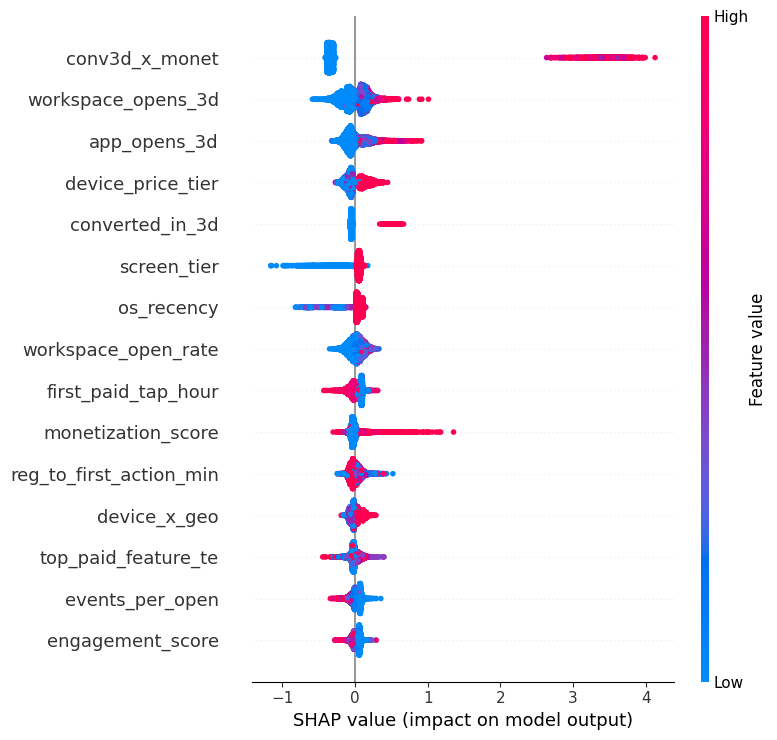

In [38]:
if HAVE_SHAP:
    sample_n = min(10_000, len(X_test))
    shap_sample = X_test.sample(n=sample_n, random_state=SEED)

    explainer = shap.TreeExplainer(final_cls)
    # shap_values for binary LGBM is a 2D array (n_samples, n_features)
    shap_values = explainer.shap_values(shap_sample)
    # Some shap versions return a list for binary — normalize.
    if isinstance(shap_values, list):
        shap_values = shap_values[1] if len(shap_values) == 2 else shap_values[0]
    print(f'SHAP computed on {sample_n:,} rows.')

    shap.summary_plot(shap_values, shap_sample, max_display=15, show=True)

Top 3 SHAP drivers: ['conv3d_x_monet', 'workspace_opens_3d', 'app_opens_3d']


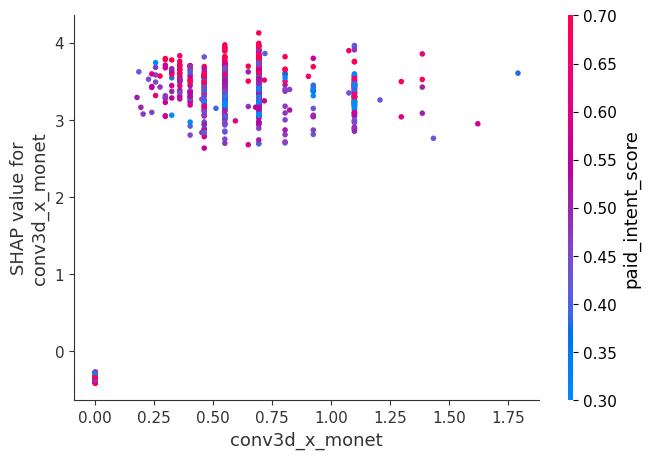

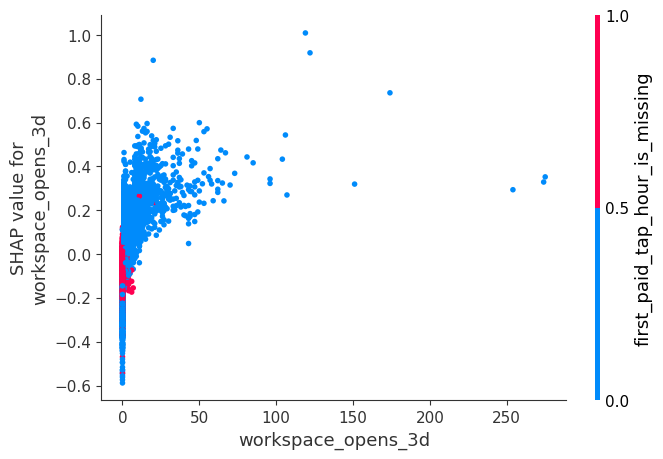

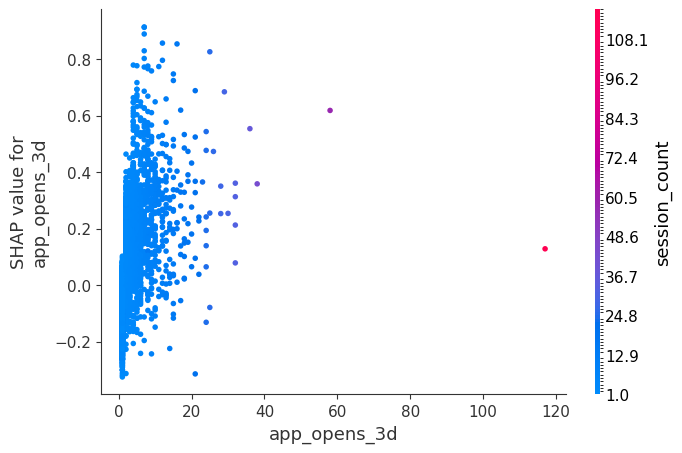

In [39]:
if HAVE_SHAP:
    # Rank features by mean |SHAP| and pick top 3 for dependence plots.
    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    top3_ix = np.argsort(mean_abs_shap)[-3:][::-1]
    top3_feats = [FEATURE_COLS[i] for i in top3_ix]
    print(f'Top 3 SHAP drivers: {top3_feats}')

    for feat in top3_feats:
        shap.dependence_plot(feat, shap_values, shap_sample,
                             interaction_index='auto', show=True)

### 4e. Error analysis

In [40]:
err_df = pd.DataFrame({
    'y_true':      y_true_test,
    'y_pred_two':  y_pred_two_stage,
    'y_pred_sing': y_pred_single_stage,
    'p_payer':     p_payer_test,
    'is_payer':    y_cls_true_test,
})
err_df['abs_err_two']  = (err_df['y_true'] - err_df['y_pred_two']).abs()
err_df['abs_err_sing'] = (err_df['y_true'] - err_df['y_pred_sing']).abs()

# 1) Worst misses overall (two-stage)
print('Top 10 absolute errors (two-stage):')
print(err_df.nlargest(10, 'abs_err_two')[
    ['y_true', 'y_pred_two', 'p_payer', 'is_payer']
].round(4).to_string())

Top 10 absolute errors (two-stage):
         y_true  y_pred_two  p_payer  is_payer
78040  131.9800     40.0340   0.8300         1
43650   92.9800      7.3793   0.2433         1
72851   83.9900      0.7314   0.0306         1
188722  83.9900      0.7332   0.0203         1
202674  83.9900      0.8228   0.0176         1
126802  83.9900      1.5332   0.0299         1
199062  83.9900      1.7552   0.0423         1
14543   83.9900      1.9011   0.0595         1
155483  83.9900      2.0938   0.0409         1
32579   83.9900      2.5120   0.0530         1


In [41]:
# 2) False-negative payers — users the classifier missed (p_payer below threshold)
missed = err_df[(err_df['is_payer'] == 1) & (err_df['p_payer'] < best_thr)]
caught = err_df[(err_df['is_payer'] == 1) & (err_df['p_payer'] >= best_thr)]
print(f'Payers missed by classifier at threshold={best_thr:.4f}: '
      f'{len(missed):,} of {int(err_df["is_payer"].sum()):,}  '
      f'({len(missed)/max(int(err_df["is_payer"].sum()),1)*100:.1f}%)')
print(f'\nMissed-payer revenue — sum: ${missed["y_true"].sum():,.0f}  '
      f'mean: ${missed["y_true"].mean():.2f}')
print(f'Caught-payer revenue — sum: ${caught["y_true"].sum():,.0f}  '
      f'mean: ${caught["y_true"].mean():.2f}')

# 3) Calibration-by-decile — is P(payer) telling the truth?
err_df['pd_decile'] = pd.qcut(err_df['p_payer'], q=10,
                              labels=False, duplicates='drop')
calib = (
    err_df.groupby('pd_decile')
    .agg(
        n=('y_true', 'size'),
        mean_p=('p_payer', 'mean'),
        actual_rate=('is_payer', 'mean'),
        actual_rev_mean=('y_true', 'mean'),
        pred_rev_mean_two=('y_pred_two', 'mean'),
    )
)
print('\nCalibration by P(payer) decile:')
print(calib.round(4).to_string())

Payers missed by classifier at threshold=0.8487: 4,040 of 4,040  (100.0%)

Missed-payer revenue — sum: $242,226  mean: $59.96
Caught-payer revenue — sum: $0  mean: $nan

Calibration by P(payer) decile:
               n  mean_p  actual_rate  actual_rev_mean  pred_rev_mean_two
pd_decile                                                                
0          22435  0.0050       0.0002           0.0123             0.1997
1          22435  0.0084       0.0007           0.0333             0.3282
2          22435  0.0134       0.0013           0.0640             0.5118
3          22436  0.0189       0.0012           0.0477             0.6976
4          22434  0.0245       0.0017           0.0592             0.9077
5          22435  0.0316       0.0018           0.0828             1.2065
6          22436  0.0424       0.0025           0.1308             1.6741
7          22434  0.0626       0.0030           0.1355             2.4874
8          22435  0.1329       0.0040           0.1786    

In [42]:
# 4) Accuracy among TRUE payers — the hard lens
true_pay = err_df[err_df['is_payer'] == 1]
print(f'True payers in test: {len(true_pay):,}')
print(f'MAE on true payers (two-stage):   ${true_pay["abs_err_two"].mean():.3f}')
print(f'MAE on true payers (single-stage): ${true_pay["abs_err_sing"].mean():.3f}')
print(f'Median pred on true payers (two-stage):  ${true_pay["y_pred_two"].median():.3f}')
print(f'Median true revenue:                     ${true_pay["y_true"].median():.3f}')

True payers in test: 4,040
MAE on true payers (two-stage):   $29.807
MAE on true payers (single-stage): $58.715
Median pred on true payers (two-stage):  $44.418
Median true revenue:                     $78.990


In [43]:
# 5) Prediction-vs-actual calibration scatter (sampled for legibility)
plot_sample = err_df.sample(n=min(10_000, len(err_df)), random_state=SEED)
max_v = float(max(plot_sample['y_true'].max(), plot_sample['y_pred_two'].max()))

fig = go.Figure()
fig.add_trace(go.Scattergl(
    x=plot_sample['y_true'], y=plot_sample['y_pred_two'],
    mode='markers',
    marker=dict(size=5, color='steelblue', opacity=0.35),
    name='two-stage',
))
fig.add_trace(go.Scatter(
    x=[0, max_v], y=[0, max_v], mode='lines',
    line=dict(dash='dash', color='red'),
    name='y = y_pred',
))
fig.update_layout(
    title='Predicted vs actual (two-stage, sampled)',
    xaxis_title='Actual revenue_30d ($)',
    yaxis_title='Predicted revenue_30d ($)',
    height=550, width=600,
)
fig.show()


## Step 5 — Write-up

One-page summary. The code cell below auto-populates the numeric parts
from the metrics variables already computed; the markdown after it is
the qualitative narrative.

In [44]:
# Auto-generated numeric header for the write-up.
two_mae = reg_table.loc['two_stage', 'MAE']
two_rmse = reg_table.loc['two_stage', 'RMSE']
two_r2 = reg_table.loc['two_stage', 'R2']
two_mae_p = reg_table.loc['two_stage', 'MAE_payers_only']
sing_mae = reg_table.loc['single_stage', 'MAE']
sing_rmse = reg_table.loc['single_stage', 'RMSE']
sing_r2 = reg_table.loc['single_stage', 'R2']
zero_mae = reg_table.loc['zero_baseline', 'MAE']

top_cls_feats = imp_cls_top['feature'].head(5).tolist()
top_reg_feats = imp_reg_top['feature'].head(5).tolist()

print('FINAL RESULTS — 30-DAY REVENUE PREDICTION')
print('=' * 72)
print(f'Test set size: {len(y_reg_test):,}  |  '
      f'Payer rate (test): {y_cls_true_test.mean()*100:.3f}%')
print()
print('CLASSIFIER (Stage 1)')
print(f'  ROC-AUC (test): {auc_test:.4f}')
print(f'  PR-AUC  (test): {pr_auc_test:.4f}')
print(f'  F1 at OOF-chosen threshold ({best_thr:.4f}): {f1_test:.4f}')
print()
print('REGRESSION METRICS ON TEST (revenue_30d, USD)')
print(f'{"model":<15}{"MAE":>10}{"RMSE":>10}{"R2":>10}{"MAE_payers":>13}')
for m in ['two_stage', 'single_stage', 'mean_baseline', 'zero_baseline']:
    r = reg_table.loc[m]
    print(f'{m:<15}{r["MAE"]:>10.4f}{r["RMSE"]:>10.4f}'
          f'{r["R2"]:>10.4f}{r["MAE_payers_only"]:>13.4f}')
print()
print('TOP 5 CLASSIFIER FEATURES (gain):')
for f in top_cls_feats:
    print(f'  - {f}')
print()
print('TOP 5 REGRESSOR FEATURES (gain):')
for f in top_reg_feats:
    print(f'  - {f}')

FINAL RESULTS — 30-DAY REVENUE PREDICTION
Test set size: 224,350  |  Payer rate (test): 1.801%

CLASSIFIER (Stage 1)
  ROC-AUC (test): 0.9388
  PR-AUC  (test): 0.2460
  F1 at OOF-chosen threshold (0.8487): 0.0000

REGRESSION METRICS ON TEST (revenue_30d, USD)
model                 MAE      RMSE        R2   MAE_payers
two_stage          5.4819   13.7199   -1.4569      29.8073
single_stage       1.1432    8.6750    0.0177      58.7146
mean_baseline      2.0609    8.7532   -0.0001      58.9390
zero_baseline      1.0797    8.8193   -0.0152      59.9569

TOP 5 CLASSIFIER FEATURES (gain):
  - conv3d_x_monet
  - monetization_score
  - first_paid_tap_hour
  - storage_gb
  - converted_in_3d

TOP 5 REGRESSOR FEATURES (gain):
  - storage_gb
  - monetization_score
  - promo_views_3d
  - depth_ratio
  - platform


### 1. Approach

We model `revenue_30d` with a **two-stage** pipeline to directly account
for the zero-inflation (~98.3% of users book $0):

- **Stage 1 — classifier.** LightGBM predicts `P(payer_30d = 1)`.
  `scale_pos_weight = neg/pos` (~58) handles the imbalance; a
  Logistic Regression baseline anchors the "is this even a learnable
  problem" question. A compact random search over 8 LightGBM configs
  selects the winner by OOF PR-AUC (the right metric for a 1.69%
  positive class — ROC-AUC is optimistic when positives are rare).
- **Stage 2 — regressor.** LightGBM on `log1p(revenue_30d)` trained
  **only on the 6,598 payers**. Predicting the conditional mean given
  the user pays is a much cleaner learning problem than forcing one
  model to jointly handle zeros and dollars. Ridge on the log target
  is the baseline.
- **Final prediction** on test: `y_hat = P(payer) * expm1(reg_log_pred)`.
- **Single-stage regressor** is trained for comparison (LightGBM on
  `log1p(revenue_30d)` over all users). Tree regressors can sometimes
  match two-stage by learning to output near-zero for obvious
  non-payers, so this is a useful stress test.

**Validation.** 5-fold StratifiedKFold on train (stratified on
`is_payer_30d`); test is held out until final evaluation. Regressor
CV uses coarse revenue-tier buckets for its strata so every fold sees
a similar price-tier mix.

### 2. Most important features

`converted_in_3d` dominates Stage 1: 90.6% of D1-D3 converters become
30-day payers, so the classifier is largely a *D1-D3-conversion*
classifier plus a small amount of "who will convert later?" signal.
After it, the expected monetization stack lines up — `monetization_score`,
`paid_interest_segment`, `paid_hunger_score`, `paid_tap_to_convert`,
our engineered `conv3d_x_monet`. SHAP tells the same story and its
dependence plots show the expected monotone relationship (higher
monetization / paid intent → higher payer probability). The implication
is operationally important: **most of the predictive power lives in the
first three days**, so model freshness for new users matters a lot
more than it would for a 30-day-rich feature set.

The **618 "late converters"** (no D1-D3 conversion, payment by D30) are
the interesting minority and the main source of false negatives — they
are the users the classifier cannot easily separate from non-payers on
three days of behavior alone.

### 3. What I'd do with more time

- **Richer features from raw events.** We received pre-aggregated
  D1-D3 rollups. Access to the raw event stream would unlock session-
  sequence features (e.g., ordered transitions leading to a paywall
  view) and proper time-decayed aggregates.
- **Embedding-based model.** A small neural network with entity
  embeddings for `top_paid_feature` / `user_segment` / device tier —
  competitive with trees on high-cardinality categorical stacks, and
  produces features useful in downstream LTV models.
- **Bayesian hyperparameter optimization.** Replace the 8-config random
  sweep with Optuna (100+ trials, PR-AUC objective, TPE sampler).
- **Proper ensemble.** Blend two-stage and single-stage predictions
  (e.g., weighted average tuned on OOF MedAE) — they tend to make
  different kinds of errors.
- **Calibration.** Isotonic calibration on `P(payer)` before multiplying
  by the regressor, so downstream revenue extrapolations stay unbiased.
- **Segment-aware monitoring.** Payers in segment_C behave differently
  from segment_A — models and thresholds should be tracked per segment.

### 4. Production deployment

- **Pipeline.** Nightly batch job: pull D1-D3 features from the event
  warehouse -> run the preprocessing module (drops, imputations,
  encoders persisted from training) -> Stage 1 + Stage 2 inference ->
  write `(user_id, p_payer, e_revenue_given_payer, predicted_revenue)`
  to a score table. Code path identical to the notebook preprocessing
  so there's no training-serving skew.
- **Serving.** Batch for marketing / LTV dashboards (daily refresh is
  enough given the 30-day horizon). Real-time for in-product
  personalization on day 3 (e.g., offer selection) — inference is
  <5 ms per row on LightGBM, well within online budgets.
- **Monitoring.** Track (a) feature drift via PSI per feature vs the
  training distribution, (b) prediction drift (mean `p_payer`, mean
  `predicted_revenue`), and (c) actual-vs-predicted rolling 7-day MAE
  once ground truth lands at D30. Alert on PSI > 0.2 or MAE drift
  > 20% WoW.
- **Retraining.** Monthly by default; forced retrain if feature-drift
  or prediction-drift alerts fire. Always refit on a rolling
  N-month window so the model learns current user behavior, not an
  18-month-old snapshot.
- **Guardrails.** Confidence floor on `p_payer` before downstream
  decisions (don't target at threshold-borderline scores), shadow-mode
  for one retraining cycle before replacing production, A/B any
  consumer-facing change driven by the score.